# Training and Inference with Detectron 2 Framework for Number Plates Detection
<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">

## Access your drive

In [3]:
from google.colab import drive
drive.mount('/content/drive')
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


In [4]:
cd drive/My\ Drive

/content/drive/My Drive


In [7]:
mkdir NumberPlates


'/content/drive/My Drive'

In [8]:
cd NumberPlates

/content/drive/My Drive/NumberPlates


## Install and build required dependencies


In [9]:
!pip install -U torch torchvision cython
!pip install -U 'git+https://github.com/facebookresearch/fvcore.git' 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -e detectron2_repo

Requirement already up-to-date: torch in /usr/local/lib/python3.6/dist-packages (1.4.0)
Requirement already up-to-date: torchvision in /usr/local/lib/python3.6/dist-packages (0.5.0)
Requirement already up-to-date: cython in /usr/local/lib/python3.6/dist-packages (0.29.15)
  Cloning https://github.com/facebookresearch/fvcore.git to /tmp/pip-req-build-2uya8uc6
  Running command git clone -q https://github.com/facebookresearch/fvcore.git /tmp/pip-req-build-2uya8uc6
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-aywiss50
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-aywiss50
  Created wheel for fvcore: filename=fvcore-0.1-cp36-none-any.whl size=41712 sha256=30436e9dc1e2cac840d574bea8c52b590543a3efb87c3c1a48889cfabccb0d72
  Stored in directory: /tmp/pip-ephem-wheel-cache-266edccq/wheels/48/53/79/3c6485543a4455a0006f5db590ab9957622b6227011941de06
  Created wheel for pycocotools: filename=pycocotools-2.0-cp36-cp36m-lin

### And restart the Runtime

## Clone into Gdown.pl and download the dataset

In [1]:
!git clone https://github.com/circulosmeos/gdown.pl

fatal: destination path 'gdown.pl' already exists and is not an empty directory.


In [2]:
cd gdown.pl

/content/gdown.pl


In [0]:
!sudo chmod 777 gdown.pl

In [4]:
!./gdown.pl https://drive.google.com/file/d/1u1VNPrDPP6AePoiYESldTBepFaamrMbY plates_coco.zip
!mv plates_coco.zip ../

Cannot open cookies file ‘gdown.cookie.temp’: No such file or directory
--2020-03-05 18:13:03--  https://docs.google.com/uc?id=1u1VNPrDPP6AePoiYESldTBepFaamrMbY&export=download
Resolving docs.google.com (docs.google.com)... 64.233.191.113, 64.233.191.102, 64.233.191.139, ...
Connecting to docs.google.com (docs.google.com)|64.233.191.113|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/html]
Saving to: ‘plates_coco.zip’

     0K                                     46.5M=0s

2020-03-05 18:13:03 (46.5 MB/s) - ‘plates_coco.zip’ saved [3250]

--2020-03-05 18:13:03--  https://docs.google.com/uc?export=download&confirm=eqCH&id=1u1VNPrDPP6AePoiYESldTBepFaamrMbY
Resolving docs.google.com (docs.google.com)... 64.233.191.101, 64.233.191.138, 64.233.191.113, ...
Connecting to docs.google.com (docs.google.com)|64.233.191.101|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-0g-8g-docs.googleusercontent.c

In [6]:
!cd ../
!unzip -q plates_coco.zip

replace plates_coco/JPEGImages/vodec_0190.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace plates_coco/JPEGImages/vodec_0153.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace plates_coco/JPEGImages/vodec_0147.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


## Get pretrained model in case you want to do inference straight away.

In [14]:
!mkdir output
!cd gdown.pl
!./gdown.pl https://drive.google.com/file/d/1hMCczENeCLd-jq7KGW9ak8B-QkWVUoXg ../output/model_final.pth

Cannot open cookies file ‘gdown.cookie.temp’: No such file or directory
--2020-03-05 18:15:20--  https://docs.google.com/uc?id=1hMCczENeCLd-jq7KGW9ak8B-QkWVUoXg&export=download
Resolving docs.google.com (docs.google.com)... 64.233.191.101, 64.233.191.102, 64.233.191.100, ...
Connecting to docs.google.com (docs.google.com)|64.233.191.101|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/html]
Saving to: ‘../output/model_final.pth’

     0K                                     53.2M=0s

2020-03-05 18:15:20 (53.2 MB/s) - ‘../output/model_final.pth’ saved [3251]

--2020-03-05 18:15:20--  https://docs.google.com/uc?export=download&confirm=NUFa&id=1hMCczENeCLd-jq7KGW9ak8B-QkWVUoXg
Resolving docs.google.com (docs.google.com)... 64.233.191.100, 64.233.191.138, 64.233.191.102, ...
Connecting to docs.google.com (docs.google.com)|64.233.191.100|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-0s-6o-docs

## Training

In [0]:
# basic libraries
import matplotlib.pyplot as plt
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

# detectron2 utilities
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

from detectron2.data.datasets import register_coco_instances

# register dataset
register_coco_instances("plates", {}, "./plates_coco/annotations.json", "./plates_coco/")

plates_metadata = MetadataCatalog.get("plates")
dataset_dicts = DatasetCatalog.get("plates")

from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import torch, os

cfg = get_cfg()
cfg.merge_from_file("./detectron2_repo/configs/COCO-Detection/retinanet_R_50_FPN_3x.yaml")


cfg.DATASETS.TRAIN = ("plates",)
cfg.DATASETS.TEST = ()   
cfg.DATALOADER.NUM_WORKERS = 2

# initialize model from model zoo
cfg.MODEL.WEIGHTS = "detectron2://ImageNetPretrained/MSRA/R-50.pkl"  
#cfg.MODEL.WEIGHTS = 'output/model_final.pth' 
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   
cfg.SOLVER.BASE_LR = 0.00025

cfg.SOLVER.MAX_ITER = 10000    
cfg.SOLVER.CHECKPOINT_PERIOD = 500

# we've only one class - plate
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

## Inference

Loading config ./detectron2_repo/configs/COCO-Detection/../Base-RetinaNet.yaml with yaml.unsafe_load. Your machine may be at risk if the file contains malicious content.


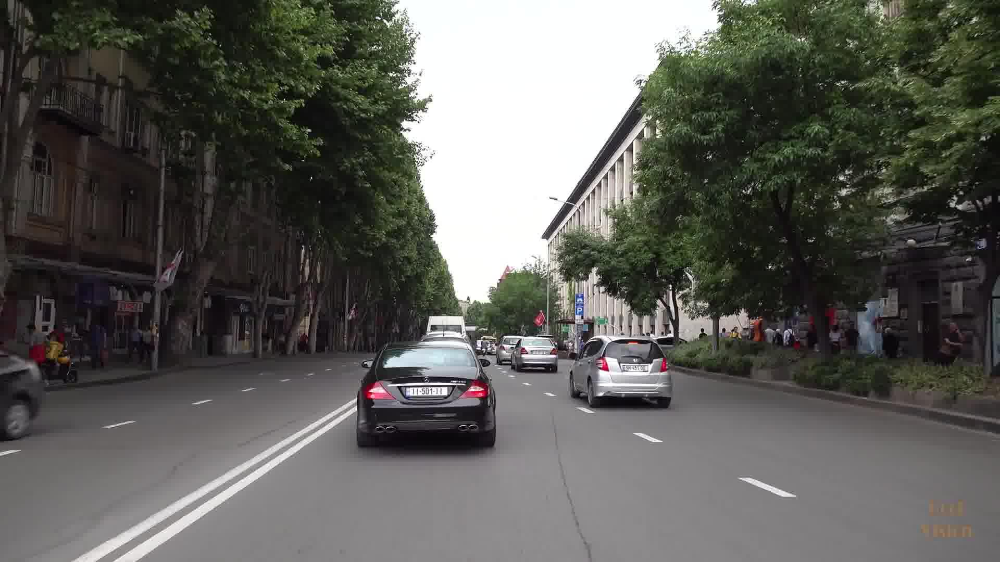

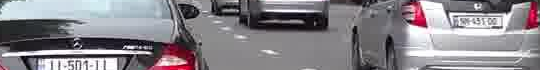

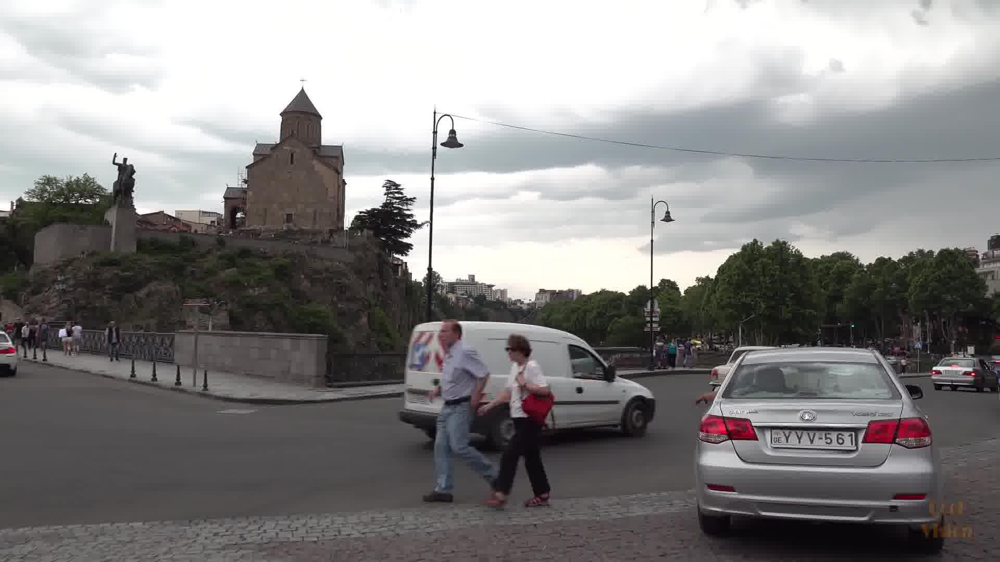

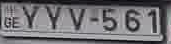

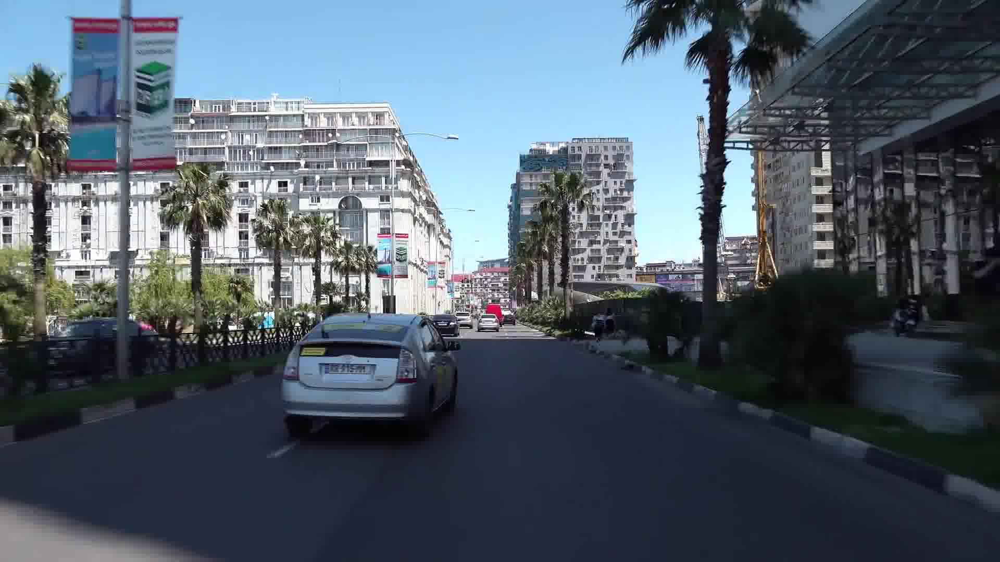

...

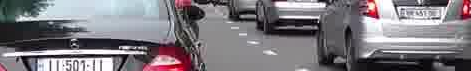

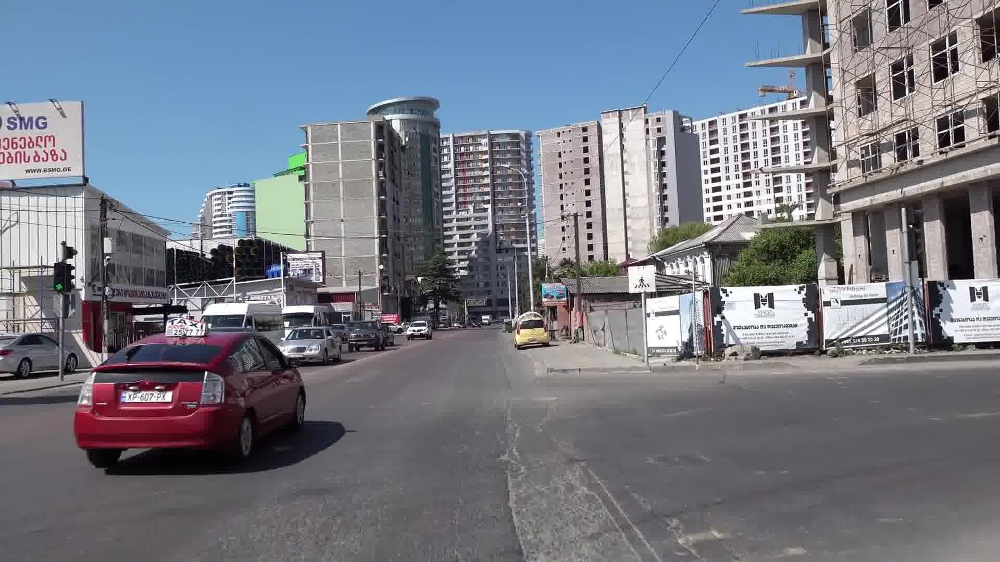

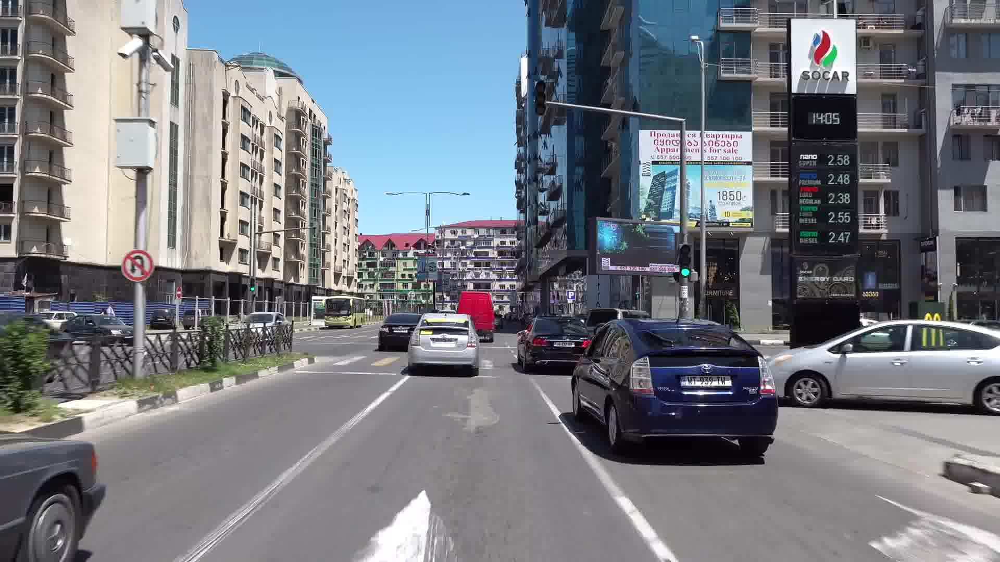

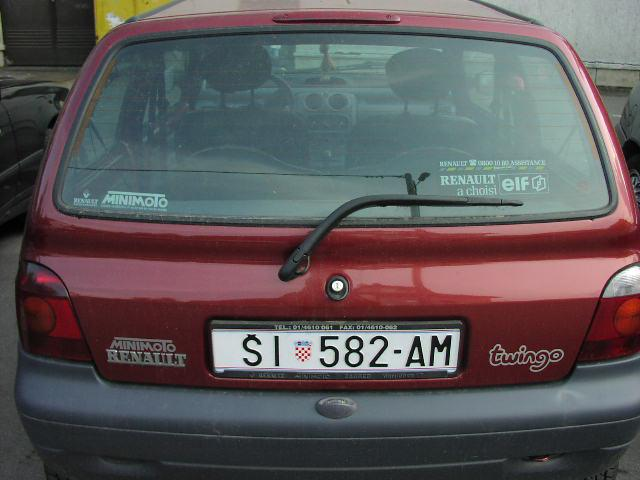

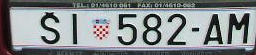

In [49]:
import random as r
import math
import cv2
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
import glob
from detectron2.data.datasets import register_coco_instances
from google.colab.patches import cv2_imshow
cfg = get_cfg()

cfg.merge_from_file("./detectron2_repo/configs/COCO-Detection/retinanet_R_50_FPN_3x.yaml")

# detector threshold

cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  
cfg.MODEL.WEIGHTS = 'output/model_final.pth'
cfg.DATASETS.TEST = ("plates", )
predictor = DefaultPredictor(cfg)

# get images with glob function to filelist to iterate through. Use any directory for testing, with your prefered format of 
# images: .png, .jpg, .jpeg.

filelist = glob.glob('./plates_coco/JPEGImages/*.jpg')
#print(filelist)
for i in range(10):
    img = cv2.imread(filelist[i])
    
    # prediction
    outputs = predictor(img)
    
    ### uncomment the below script in case you want to see the detector visualisations
    
    ### v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TEST[0]), scale=1.2)
    ### v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    ### cv2_imshow(v.get_image()[:, :, ::-1])
    
    # getting prediction bboxes from model outputs

    boxes = outputs['instances'].pred_boxes.tensor.cpu().numpy()[0]
    x2 = math.ceil(boxes[0])
    x1 = math.ceil(boxes[1])
    y2 = math.ceil(boxes[2])
    y1 = math.ceil(boxes[3])
    crop_img = img[x1:y1,x2:y2]
    #crop_img = cv2.resize(crop_img, (500,250))
    # showing original image
#     fig, ax = plt.subplots(ncols=2)
#     ax[0].imshow(img[..., ::-1])  # BGR to RGB
# ax[0].set_title('Original image')

# ax[1].imshow(gray_img, cmap=plt.cm.gray)
# ax[1].set_title('Grayscale image')
    cv2_imshow(img)
    # showing cropped number plate
    cv2_imshow(crop_img)
